# Overlay cell segmentation

In [1]:
%load_ext autoreload

import os 
import sys
import time
import logging
import re
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import json
import geopandas
from natsort import natsorted
import copy
import anndata as ad

sys.path.append('../../')
# sys.path.append('..')

from GRIDGEN.src import get_arrays as ga
from GRIDGEN.src import contours 
from GRIDGEN.src import masks
from GRIDGEN.src.mask_properties import GetMasksProperties



# define the logger :  can be None, and is set to INFO
# Custom logger setup
logger = logging.getLogger('contour_logger')
handler = logging.StreamHandler()
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)
logger.setLevel(logging.INFO)


import matplotlib.pyplot as plt
import matplotlib.patches as patches
# from shapely.geometry import Polygon
from PIL import Image, ImageDraw
from matplotlib.colors import ListedColormap
from matplotlib import patches as mpatches

In [2]:
# functions to plot the masks
def plot_masks(mask_paths, titles, color, background='white'):
    # Create a new figure
    fig, axs = plt.subplots(1, len(mask_paths), figsize=(15, 15))

    # Generate a colormap
    cmap = ListedColormap([background, color])

    for ax, mask_path, title in zip(axs, mask_paths, titles):
        # Load the mask
        mask = np.load(mask_path)

        # Display the mask
        ax.imshow(mask, cmap=cmap)

        # Add a title
        ax.set_title(title)

    # Show the plot
    plt.show()

def plot_masks_overlay(mask_paths, titles, colors, background='white'):
    # Create a new figure
    plt.figure(figsize=(10, 10))
# 
    # Generate a colormap
    cmap = ListedColormap([background] + colors)

    # Initialize an empty mask to store the overlay
    overlay = np.zeros_like(np.load(mask_paths[0]))

    for i, mask_path in enumerate(mask_paths):
        # Load the mask
        mask = np.load(mask_path)

        # Add the mask to the overlay, scaled by its index
        overlay += (mask * (i+1))

    # Display the overlay
    plt.imshow(overlay, cmap=cmap, origin = 'lower')

    # Add a legend
    plt.legend(handles=[mpatches.Patch(color=cmap(i+1), label=title) for i, title in enumerate(titles)], loc='best')

    # Show the plot
    plt.show()

def plot_masks_overlay_segmentation(mask_dict, titles, colors, geojson_data, min_x = None, min_y = None, background='white'):
    # Create a new figure
    fig, ax = plt.subplots(figsize=(10, 10))

    # Generate a colormap
    cmap = ListedColormap([background] + colors)

    # Initialize an empty mask to store the overlay
    overlay = np.zeros_like(next(iter(mask_dict.values())), dtype=np.int64)

    for i, (mask_name, mask) in enumerate(mask_dict.items()):
        # Add the mask to the overlay, scaled by its index
        overlay += (mask * (i+1))

    # Display the overlay
    ax.imshow(overlay, cmap=cmap, origin = 'lower')

    # Plot the polygons on the same axis
    polygons_baysor_cellprior = [geometry['coordinates'][0] for geometry in geojson_data['geometries']]
    
    # Shift and plot the polygons
    for polygon in polygons_baysor_cellprior:
        polygon = np.array(polygon)
        if min_x is not None and min_y is not None:
            polygon = polygon - np.array([min_x, min_y])  # Shift the polygon coordinates
        ax.plot(polygon[:, 0], polygon[:, 1], color='black', linewidth=0.3)

    # Add a legend
    # plt.legend(handles=[patches.Patch(color=cmap(i+1), label=title) for i, title in enumerate(titles)], loc='best')

    # Show the plot
    plt.show()

def plot_polygons( geojson_data, title):
    polygons_baysor_cellprior = [geometry['coordinates'][0] for geometry in geojson_data['geometries']]
    # Create a figure with three subplots
    fig, ax = plt.subplots(1, 1, figsize=(15, 15))

    # Plot the polygons from both polygons_baysor_cellprior and polygons_baysor_nucprior in the third subplot
    for polygon in polygons_baysor_cellprior:
        polygon = np.array(polygon)
        plt.plot(polygon[:, 0], polygon[:, 1], color='black', linewidth=0.3)
    
    plt.title(title)
    plt.show()

def plot_polygons_categorical_annotation(geojson_data, adata, annotation_col, color_mapping, title, min_x, min_y):
    polygons_baysor_cellprior = [geometry['coordinates'][0] for geometry in geojson_data['geometries']]
    cell_ids = [int(geometry['cell']) for geometry in geojson_data['geometries']]

    fig, ax = plt.subplots(1, 1, figsize=(15, 15))

    for polygon, cell_id in zip(polygons_baysor_cellprior, cell_ids):
        polygon = np.array(polygon)
        if min_x is not None and min_y is not None:
            polygon = polygon - np.array([min_x, min_y])  # Shift the polygon coordinates

        # Get the annotation for the cell
        if cell_id in adata.obs['cellID'].values:
            annotation = adata.obs.loc[adata.obs['cellID'] == cell_id, annotation_col].values[0]
        else: annotation = None    
        # Get the fill color for the annotation
        fill_color = color_mapping.get(annotation, 'grey')
        plt.plot(polygon[:, 0], polygon[:, 1], color='black', linewidth=0.3)
        plt.fill(polygon[:, 0], polygon[:, 1], color=fill_color)

    plt.title(title)

    # Create legend handles
    legend_handles = [mpatches.Patch(color=color, label=label) for label, color in color_mapping.items()]
    
    # Create the legend
    # plt.figure(figsize=(3, 3))  # Adjust as needed
    plt.legend(handles=legend_handles, loc='lower right')
    plt.axis('off')  # Hide axes

    plt.show()

adata file with phenotyping for all Xenium cohort analysis

In [19]:
adata_file = '../../xenium/HLA_analysis/cell_prior07_v24_09_with_mask_mapping.h5ad'
adata_file = '../../xenium/HLA_analysis/cell_prior07_v20_03.h5ad'

adata = ad.read_h5ad(adata_file)
adata.obs['cellID'] = adata.obs['Name'].str.split('-').str[1].astype(int)
adata.obs['Selection'] = adata.obs['Selection'].str.replace(" ", "")

selection_coord_hla1 = f'../../xenium_data/HLA/GD_TMA1_S3/coordinates_HLA1.csv'

# Analysis of one core

grab cell annotation adata

In [4]:
tma_number = 1
selection_number = 13
# 1 11
fov = f'TMA{tma_number}_Selection{selection_number}'

In [20]:
adata_selection = adata[adata.obs['XENIUM_TMA']== f'TMA{tma_number}']
adata_selection = adata_selection[adata_selection.obs['Selection']== f'Selection{selection_number}']

Open the geojson file with the coordinates. Here, because each core come from a selection from a full slide, we will check the coordinates of the selection, so we can set to zero. 

In [6]:
baysor_4B = f'../../xenium/HLA_analysis/cell_segmentation/cells_prior07/{fov}/segmentation_polygons.json'

with open(baysor_4B, 'r') as file:
    geojson_data = json.load(file)

coordinates_selection = pd.read_csv(selection_coord_hla1)
coordinates_selection = coordinates_selection.loc[coordinates_selection['Selection']==f'Selection {selection_number}']
min_x= min(coordinates_selection['X'])
min_y= min(coordinates_selection['Y'])

get masks. The masks need to be rotated so they align with cell segmentation

In [7]:
masks_path = f'../projects/HLA/results/tb_hla_per_object/{fov}'
masks_path = f'results/tb_xenium_gr/{fov}'


mask_stroma = os.path.join(masks_path, 'mask_stroma_tborder.npy')
mask_tumour = os.path.join(masks_path, 'mask_tumour_tborder.npy')
mask_tb10um = os.path.join(masks_path, 'mask_TB_10px.npy')
mask_tb20um = os.path.join(masks_path, 'mask_TB_20px.npy')

mask_paths = [mask_stroma, mask_tumour, mask_tb10um, mask_tb20um]
mask_dict = {}
for mask_path in mask_paths:
    mask_name = os.path.basename(mask_path).split('.')[0]  # Get the file name without extension
    mask_dict[mask_name] = np.load(mask_path)

# # Assuming mask_dict is your dictionary of masks
for mask_name, mask in mask_dict.items():
    mask = np.flip(mask, 0)  # Flip vertically
    mask = np.rot90(mask, -1)  # Rotate 90 degrees to the right
    mask_dict[mask_name] = mask

Plot the masks overlayed with the segmentation

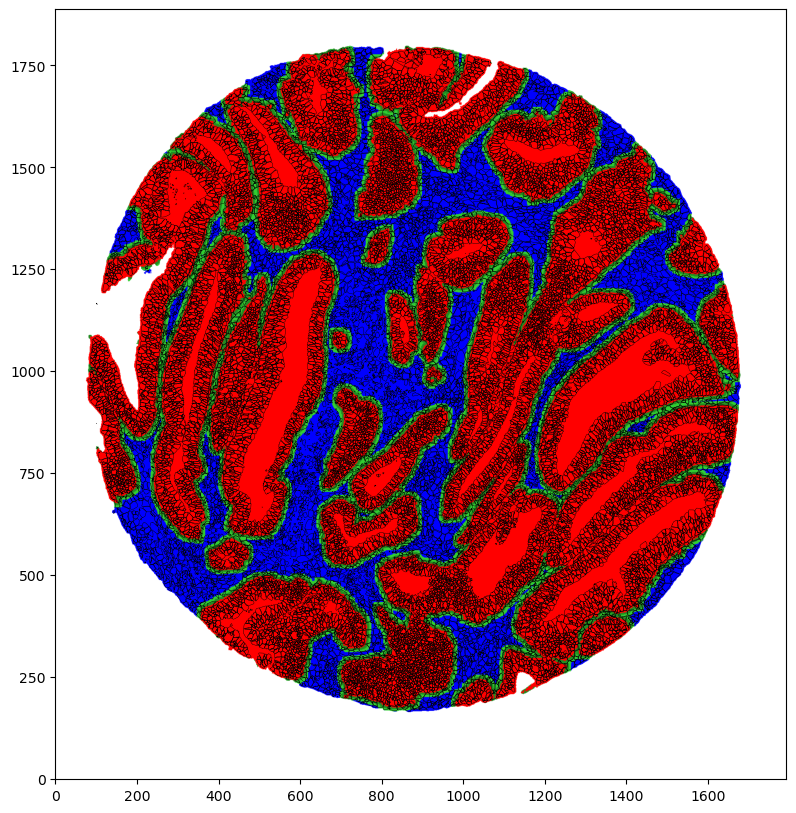

In [8]:
titles = ['Stroma Mask', 'Tumour Mask', '10um Mask', '20um Mask', ]
colors = ['blue', 'red', 'ForestGreen', 'LimeGreen', ]  #  'LimeGreen','LawnGreen', 'GreenYellow', 'green' 'MediumSeaGreen'
plot_masks_overlay_segmentation(mask_dict, titles, colors, geojson_data, min_x=min_x, min_y=min_y, background='white')

 plot the cell annotation

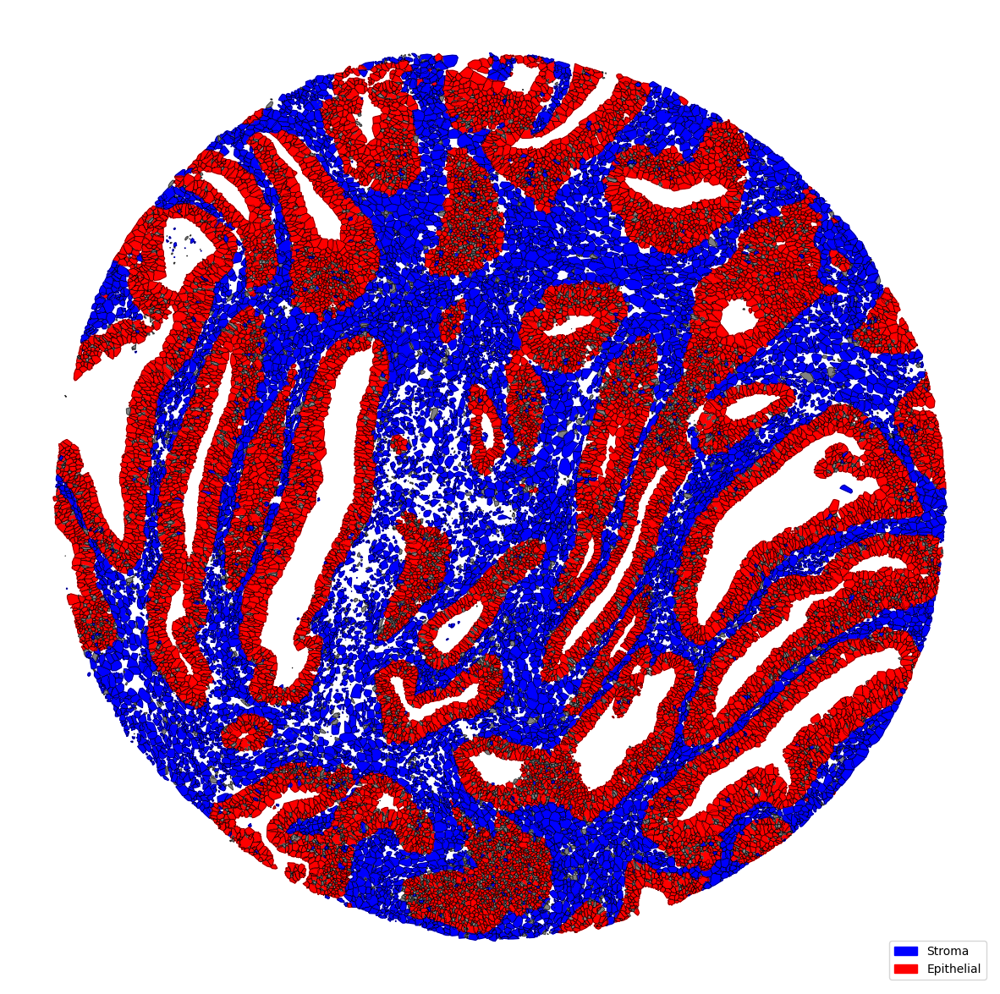

In [9]:
# Create a color mapping dictionary
annotation_col = 'annotation_level0'
unique_annotations = adata.obs[annotation_col].unique()
colors = ['blue', 'red']
color_mapping = dict(zip(unique_annotations, colors))

plot_polygons_categorical_annotation(geojson_data, adata_selection, annotation_col, color_mapping, title='', min_x=min_x, min_y=min_y)

# map cells with the masks

In [10]:
%%time 
def map_mask_cell(geojson_data, mask_dict):
    # Get the shape from the first mask in the dictionary
    mask_shape = next(iter(mask_dict.values())).shape

    # Initialize a dictionary to store the results
    results = {}

    polygons_baysor_cellprior = [geometry['coordinates'][0] for geometry in geojson_data['geometries']]
    cell_ids = [int(geometry['cell']) for geometry in geojson_data['geometries']]
    for polygon, cell_id in zip(polygons_baysor_cellprior, cell_ids):
        polygon = np.array(polygon)
        # if min_x is not None and min_y is not None:
        polygon = polygon - np.array([min_x, min_y])  # Shift the polygon coordinates
        polygon = [(round(x), round(y)) for x, y in polygon]

        # Create an empty image
        img = Image.new('L', (mask_shape[1], mask_shape[0]), 0)
        # Create an ImageDraw object
        ImageDraw.Draw(img).polygon(polygon, outline=1, fill=1)
        # Convert the image to a numpy array
        polygon_mask = np.array(img)

        # Initialize a dictionary for this cell
        results[cell_id] = {}

        # For each mask
        for mask_name, mask in mask_dict.items():
            # Multiply the polygon mask with the loaded mask
            masked_pixels = polygon_mask * mask
            # Count the number of matching pixels
            count = np.count_nonzero(masked_pixels)
            # Store the result
            results[cell_id][mask_name] = count

    return results
results = map_mask_cell(geojson_data, mask_dict)

CPU times: user 5min 26s, sys: 10.2 ms, total: 5min 26s
Wall time: 5min 26s


In [11]:
# import matplotlib.pyplot as plt
# import matplotlib.patches as patches
from matplotlib.colors import Normalize

def plot_mask_results(mask_dict, geojson_data_selection, results, mask_color, color_map):
   
    # Create a new figure
    fig, ax = plt.subplots(1, 1, figsize=(15, 15))

    # For each feature in the geojson data
    for feature in geojson_data_selection['geometries']:
        # Get the cell ID and polygon coordinates
        cell_id = int(feature['cell'])
        polygon = feature['coordinates'][0]
        # Get the results for this cell
        # polygon_results = {mask_name: count for (polygon_id, mask_name), count in results.items() if polygon_id == cell_id}
        polygon_results = results.get((cell_id), {})
        # Calculate the total number of pixels in this polygon
        total_pixels = sum(polygon_results.values())

        # Calculate the percentage of pixels in the tumour mask
        if total_pixels != 0:
            percentages = {mask_name: (count / total_pixels) * 100 for mask_name, count in polygon_results.items()}
        else:
            percentages = {mask_name: 0 for mask_name in polygon_results.keys()}

        # Calculate the total percentage for the tumour mask
        total_percentage = sum(percentages.get(mask, 0) for mask in mask_color)

        # Get a color from the 'Reds' colormap based on the total percentage
        color = plt.get_cmap(color_map)(Normalize(0, 100)(total_percentage))
        # Create a polygon and fill it with the color
        polygon_array = np.array(polygon)
        plt.plot(polygon_array[:, 0], polygon_array[:, 1], color=color, linewidth=0.3)
        polygon_patch = patches.Polygon(np.array(polygon), facecolor=color, edgecolor='black', linewidth=0.3)

        # Add the polygon to the plot
        ax.add_patch(polygon_patch)

    # Show the plot
    plt.show()

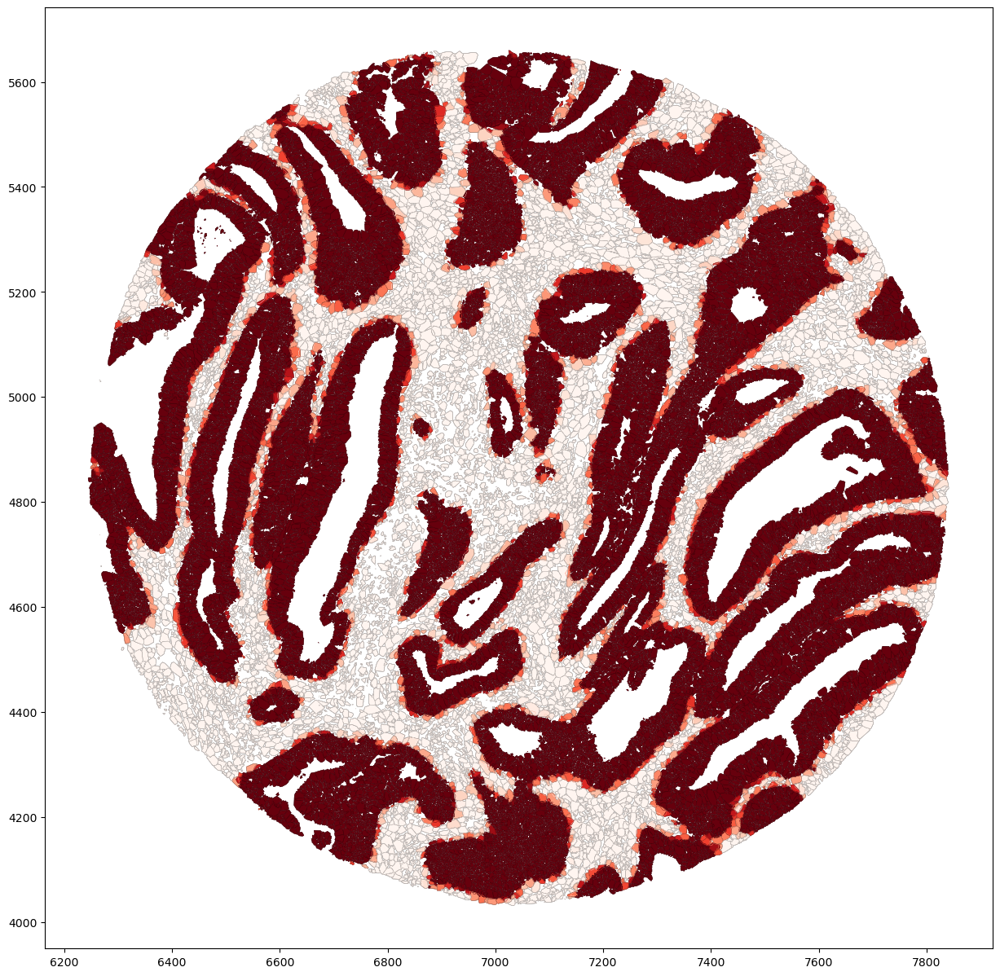

In [12]:
plot_mask_results(mask_dict,geojson_data, results, mask_color = ['mask_tumour_tborder'], color_map = 'Reds')

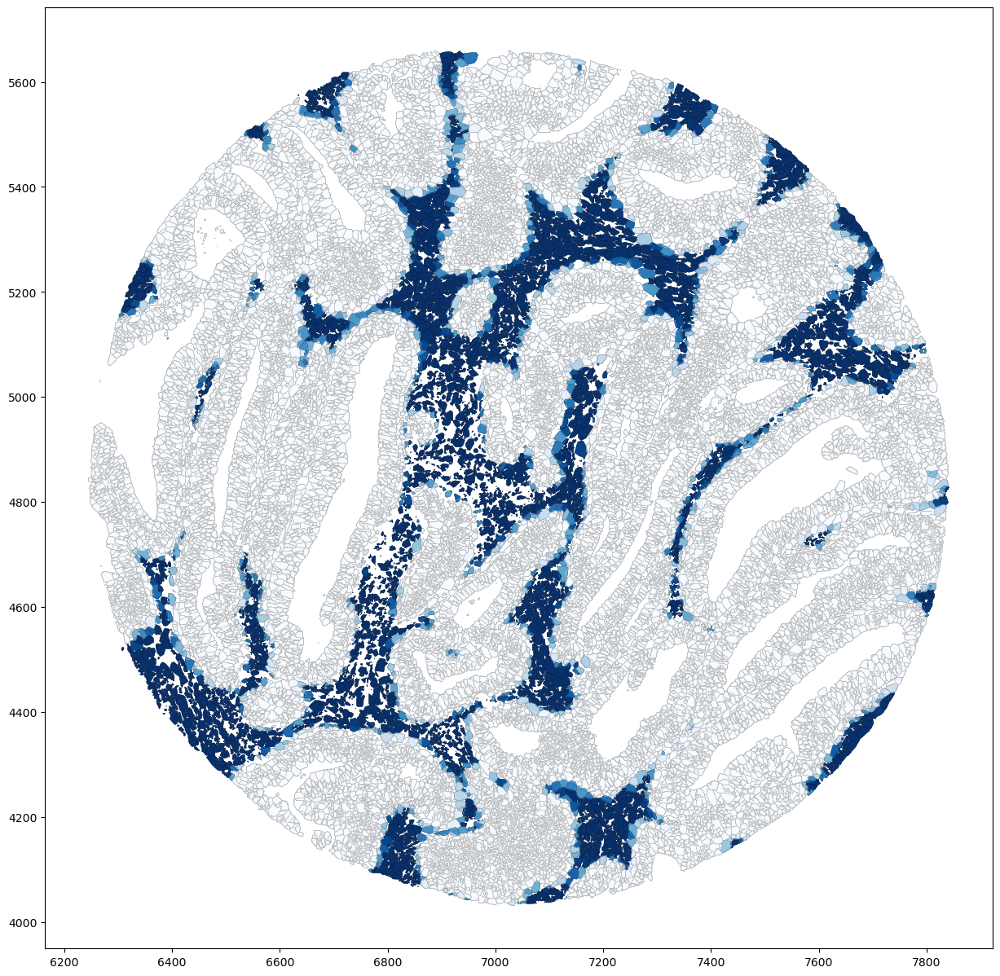

In [62]:
plot_mask_results(mask_dict, geojson_data, results, mask_color = ['mask_stroma_tborder'], color_map = 'Blues')

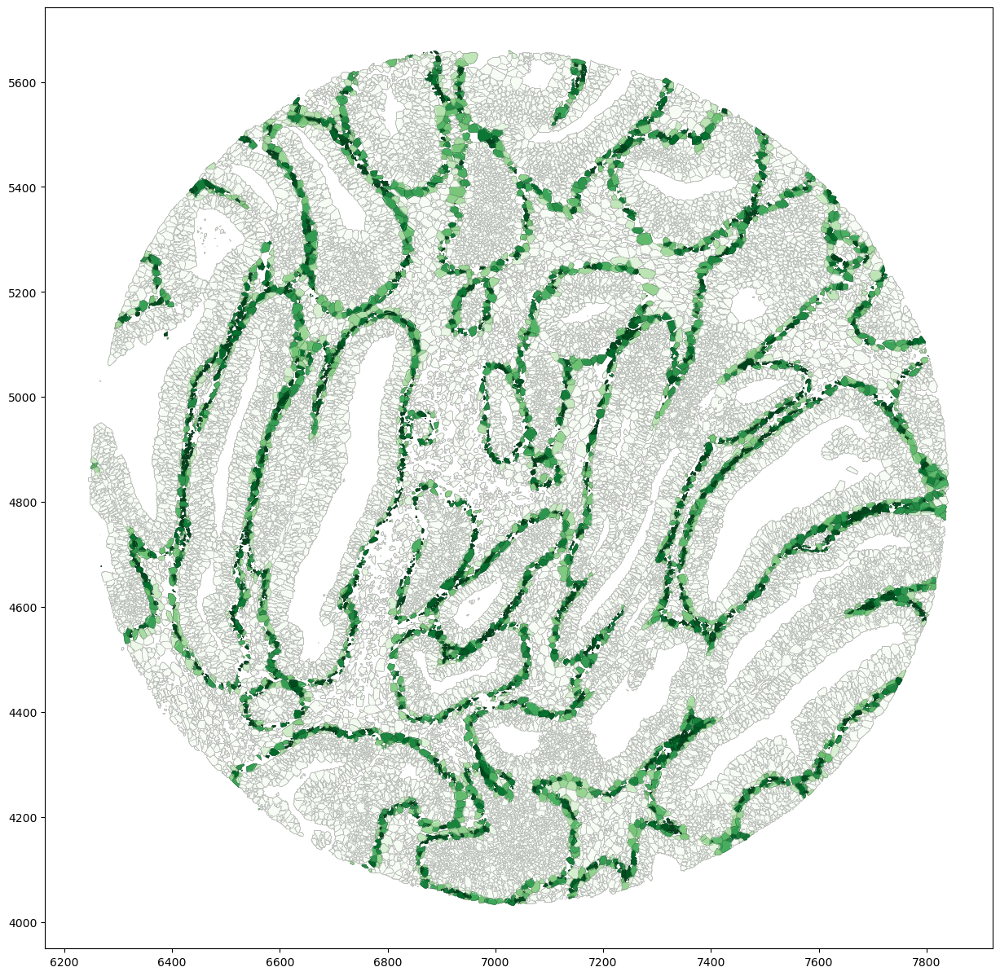

In [64]:
plot_mask_results(mask_dict, geojson_data, results, 
                  mask_color = ['mask_TB_10px', 'mask_TB_20px'], color_map = 'Greens')

Check number of immune cells in each compartment

In [23]:
adata_selection.obs.head()

,Name,area,avg_assignment_confidence,avg_confidence,cluster,density,elongation,lifespan,max_cluster_frac,n_transcripts,...,annotation_level3_notes,annotation_simple,pheno_HR_level3,pheno_HR_level2,pheno_HR_level1,cellID,mask_stroma_tborder_count,mask_tumour_tborder_count,mask_TB_10px_count,mask_TB_20px_count
CR6d7f00d5a-1_14_13,CR6d7f00d5a-1,38.34,0.8128,0.9970,3,1.382,8.920,50,0.981132,53,...,Stroma-Vsmcs-myofibroblasts,Stroma-Myofibroblasts_vsmc,Myofibroblasts,Myofibroblasts,Stromal cells,1,48,0,0,0
CR6d7f00d5a-2_14_13,CR6d7f00d5a-2,44.15,0.8825,0.9983,1,2.514,4.730,50,0.900901,111,...,Myeloid-Macrophages0,Myeloid-Macrophages,Macrophages 5,Macrophages,Myeloid cells,2,51,0,0,0
CR6d7f00d5a-3_14_13,CR6d7f00d5a-3,38.61,0.8709,0.9973,3,1.761,7.735,50,0.985294,68,...,Stroma-Vsmcs-myofibroblasts,Stroma-Myofibroblasts_vsmc,Myofibroblasts,Myofibroblasts,Stromal cells,3,37,0,0,0
CR6d7f00d5a-4_14_13,CR6d7f00d5a-4,293.80,0.8952,0.9970,3,1.559,3.257,50,0.858079,458,...,Stroma-Fibroblasts,Stroma-Fibroblasts,Fibroblasts,Fibroblasts,Stromal cells,4,315,0,0,0
CR6d7f00d5a-5_14_13,CR6d7f00d5a-5,12.71,0.8432,0.9975,3,1.967,3.413,50,1.000000,25,...,Stroma-GliaCLU+,Stroma-Glia,Glial Cells,Glial Cells,Stromal cells,5,9,0,0,0


In [22]:
for cell_id, masks in results.items():
    for mask_name, count in masks.items():
        # Create a new column for each mask
        column_name = f'{mask_name}_count'
        if column_name not in adata_selection.obs.columns:
            adata_selection.obs[column_name] = 0  # Initialize the column with zeros
        # Find the index of the cell in the DataFrame
        index = adata_selection.obs[adata_selection.obs['cellID'] == int(cell_id)].index
        # Update the count for the cell
        adata_selection.obs.loc[index, column_name] = count

/tmp/ipykernel_3381113/1294574442.py:8: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_selection.obs[column_name] = 0  # Initialize the column with zeros


In [47]:
mask_cols = ['mask_stroma_tborder_count', 'mask_tumour_tborder_count', 'mask_TB_10px_count', 'mask_TB_20px_count']
cell_type_col='pheno_HR_level2'

df = adata_selection.obs[[cell_type_col] + mask_cols].copy()
df['TB_combined'] = df['mask_TB_10px_count'] + df['mask_TB_20px_count']
# Select only stroma, tumour, TB_combined for highest mask
mask_summary = df[['mask_stroma_tborder_count', 'mask_tumour_tborder_count', 'TB_combined']]

# Get the mask column name with the maximum value per row
df['highest_mask'] = mask_summary.idxmax(axis=1)

# Optional: clean up the names if you want prettier labels
df['highest_mask'] = df['highest_mask'].replace({
    'mask_stroma_tborder_count': 'Stroma',
    'mask_tumour_tborder_count': 'Cancer',
    'TB_combined': 'Interface'
})
# Add the highest_mask column to adata_selection.obs
adata_selection.obs['highest_mask'] = df['highest_mask']

df.head()

,pheno_HR_level2,mask_stroma_tborder_count,mask_tumour_tborder_count,mask_TB_10px_count,mask_TB_20px_count,TB_combined,highest_mask
CR6d7f00d5a-1_14_13,Myofibroblasts,48,0,0,0,0,Stroma
CR6d7f00d5a-2_14_13,Macrophages,51,0,0,0,0,Stroma
CR6d7f00d5a-3_14_13,Myofibroblasts,37,0,0,0,0,Stroma
CR6d7f00d5a-4_14_13,Fibroblasts,315,0,0,0,0,Stroma
CR6d7f00d5a-5_14_13,Glial Cells,9,0,0,0,0,Stroma


In [40]:
# Group by cell type + highest_mask and count
group_counts = df.groupby([cell_type_col, 'highest_mask']).size().unstack(fill_value=0)

# Add total count per cell type
group_counts['Total'] = group_counts.sum(axis=1)

# Calculate percentage distribution per cell type
group_percent = group_counts.div(group_counts['Total'], axis=0) * 100

# Drop 'Total' from percentage (only needed for display later)
group_percent = group_percent.drop(columns=['Total'])

selected_cell_types = ['B Cell','Plasma B cell', 'CD4 T Cell', 'CD8 T Cell', 'T cells ILC', 'Macrophages']
# Select only the desired cell types
filtered_counts = group_counts.loc[selected_cell_types]

# Also get the percentage table
filtered_percent = group_percent.loc[selected_cell_types]

/tmp/ipykernel_3381113/640045683.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_counts = df.groupby([cell_type_col, 'highest_mask']).size().unstack(fill_value=0)


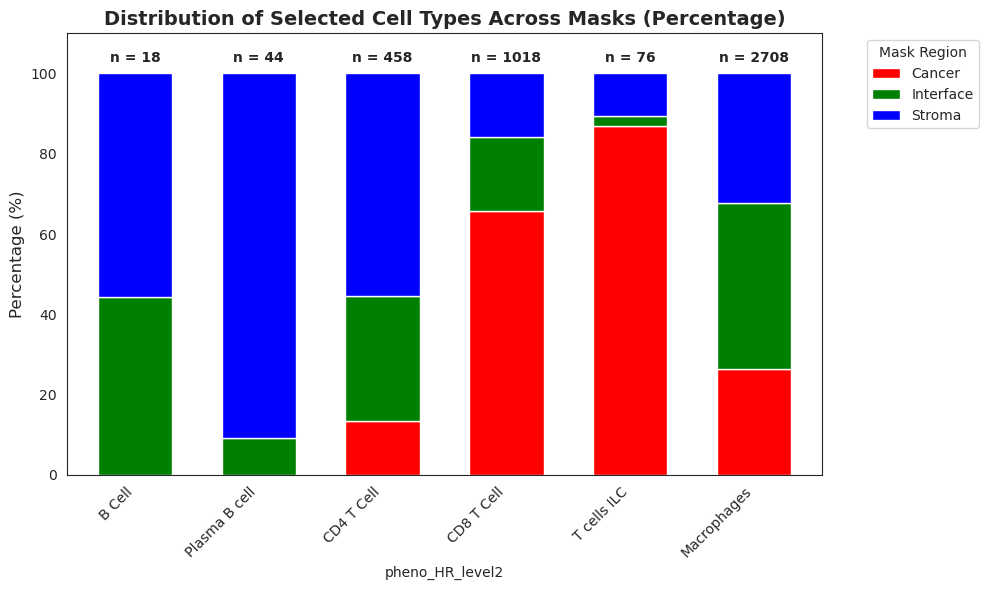

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns

# Optional: set a nicer style
sns.set_style('white')

colors = ['red', 'green', 'blue']  # order: tumour, TB, stroma (adjust as needed)

ax = filtered_percent.plot(
    kind='bar',
    stacked=True,
    figsize=(10, 6),
    color=colors,
    width=0.6  # slightly narrower bars
)

plt.ylabel('Percentage (%)', fontsize=12)
plt.title('Distribution of Selected Cell Types Across Masks (Percentage)', fontsize=14, weight='bold')

# Move legend to right outside the plot
plt.legend(title='Mask Region', bbox_to_anchor=(1.05, 1), loc='upper left')

# Calculate total counts per cell type
totals = filtered_counts.sum(axis=1)

# Add total counts as labels **above** each bar
for i, total in enumerate(totals):
    ax.text(i, 102, f'n = {int(total)}', ha='center', va='bottom', fontsize=10, weight='bold')

plt.ylim(0, 110)  # extend y-axis slightly for the labels

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)

plt.tight_layout()
plt.show()


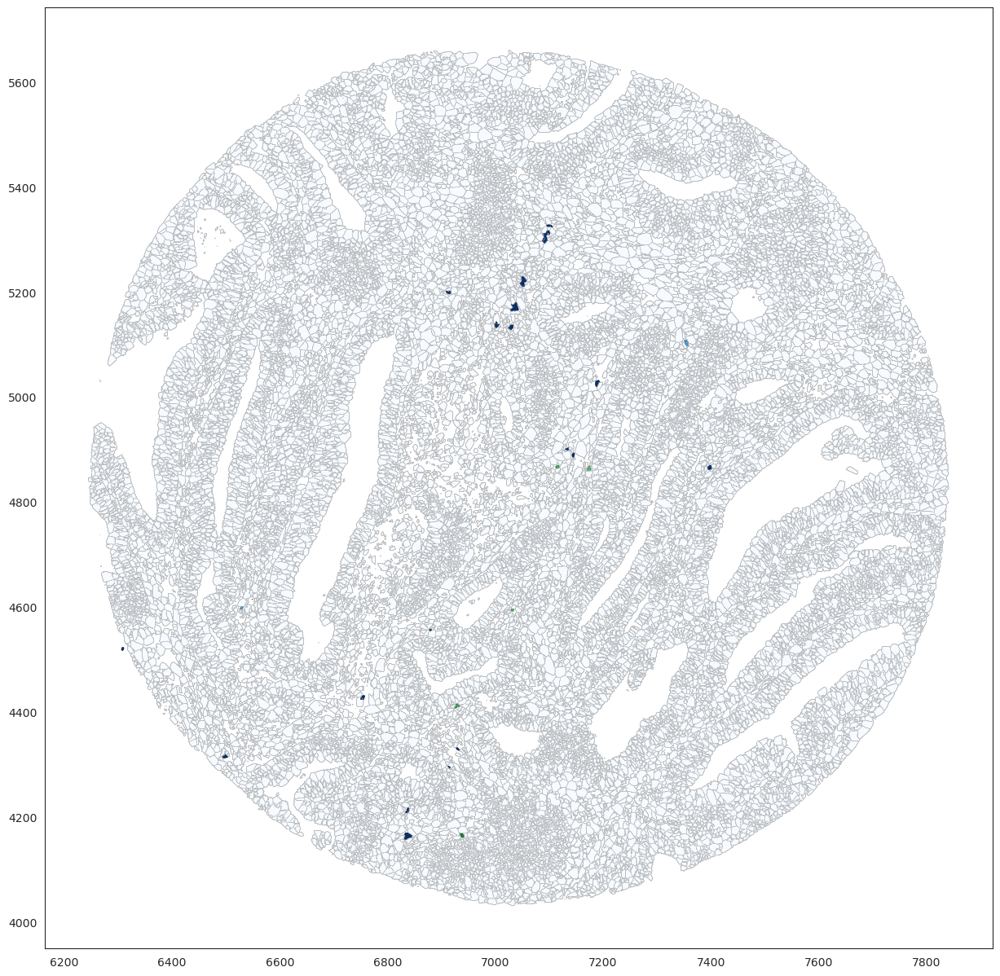

In [46]:


def plot_mask_results_cell(mask_dict, geojson_data_selection, results):
    # Create a new figure
    fig, ax = plt.subplots(1, 1, figsize=(15, 15))

    # Define the color maps for each mask
    mask_color_maps = {
        'Interface': 'Greens',
        'mask_TB_10px': 'Greens',
        'mask_TB_20px': 'Greens',
        'mask_TB_30px': 'Greens',
        'mask_TB_40px': 'Greens',
        'mask_TB_50px': 'Greens',
        'mask_stroma_tborder': 'Blues',
        'mask_tumour_tborder': 'Reds'
    }

    # For each feature in the geojson data
    for feature in geojson_data_selection['geometries']:
        # Get the cell ID and polygon coordinates
        cell_id = int(feature['cell'])
        polygon = feature['coordinates'][0]

        # Get the results for this cell
        polygon_results = results.get(int(cell_id), {mask: 0 for mask in mask_dict.keys()})

        # Find the mask with the highest value
        highest_mask = max(polygon_results, key=polygon_results.get)

        # Get the color map for the highest mask
        color_map = mask_color_maps[highest_mask]

        # Calculate the percentage of pixels in the highest mask
        total_pixels = sum(polygon_results.values())
        percentage = (polygon_results[highest_mask] / total_pixels) * 100 if total_pixels != 0 else 0

        # Get a color from the color map based on the percentage
        color = plt.get_cmap(color_map)(Normalize(0, 100)(percentage))

        # Create a polygon and fill it with the color
        polygon_array = np.array(polygon)
        plt.plot(polygon_array[:, 0], polygon_array[:, 1], color=color, linewidth=0.3)
        polygon_patch = patches.Polygon(np.array(polygon), facecolor=color, edgecolor='black', linewidth=0.3)

        # Add the polygon to the plot
        ax.add_patch(polygon_patch)

    # Show the plot
    plt.show()


b_cells_annot = ['B Cell','Plasma B cell']
immune_cells_data = adata_selection[adata_selection.obs['pheno_HR_level2'].isin(b_cells_annot)]
immune_cell_ids = set(immune_cells_data.obs['cellID'].values)


results_immune = {int(cell_id): cell_results for cell_id, cell_results in results.items() if int(cell_id) in immune_cell_ids}
plot_mask_results_cell(mask_dict, geojson_data, results_immune)


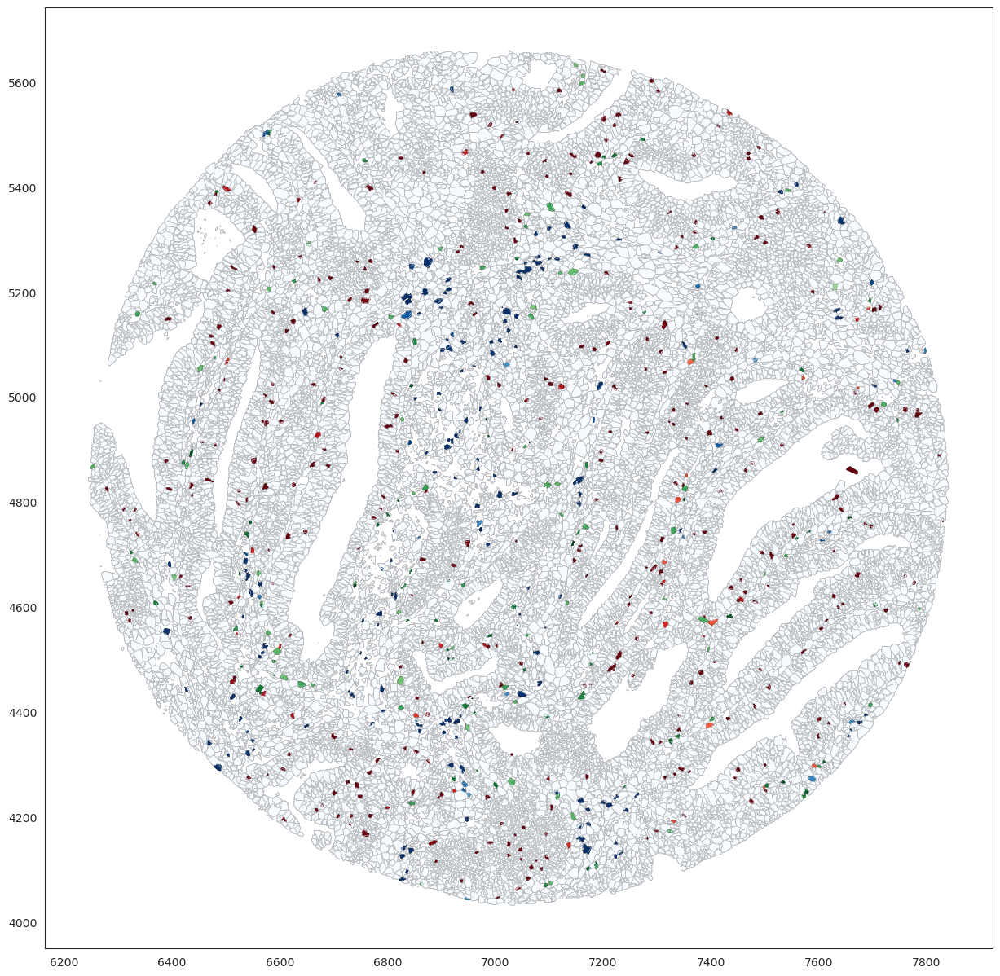

In [48]:
b_cells_annot = ['CD4 T Cell', 'CD8 T Cell', 'T cells ILC']
immune_cells_data = adata_selection[adata_selection.obs['pheno_HR_level2'].isin(b_cells_annot)]
immune_cell_ids = set(immune_cells_data.obs['cellID'].values)


results_immune = {int(cell_id): cell_results for cell_id, cell_results in results.items() if int(cell_id) in immune_cell_ids}
plot_mask_results_cell(mask_dict, geojson_data, results_immune)


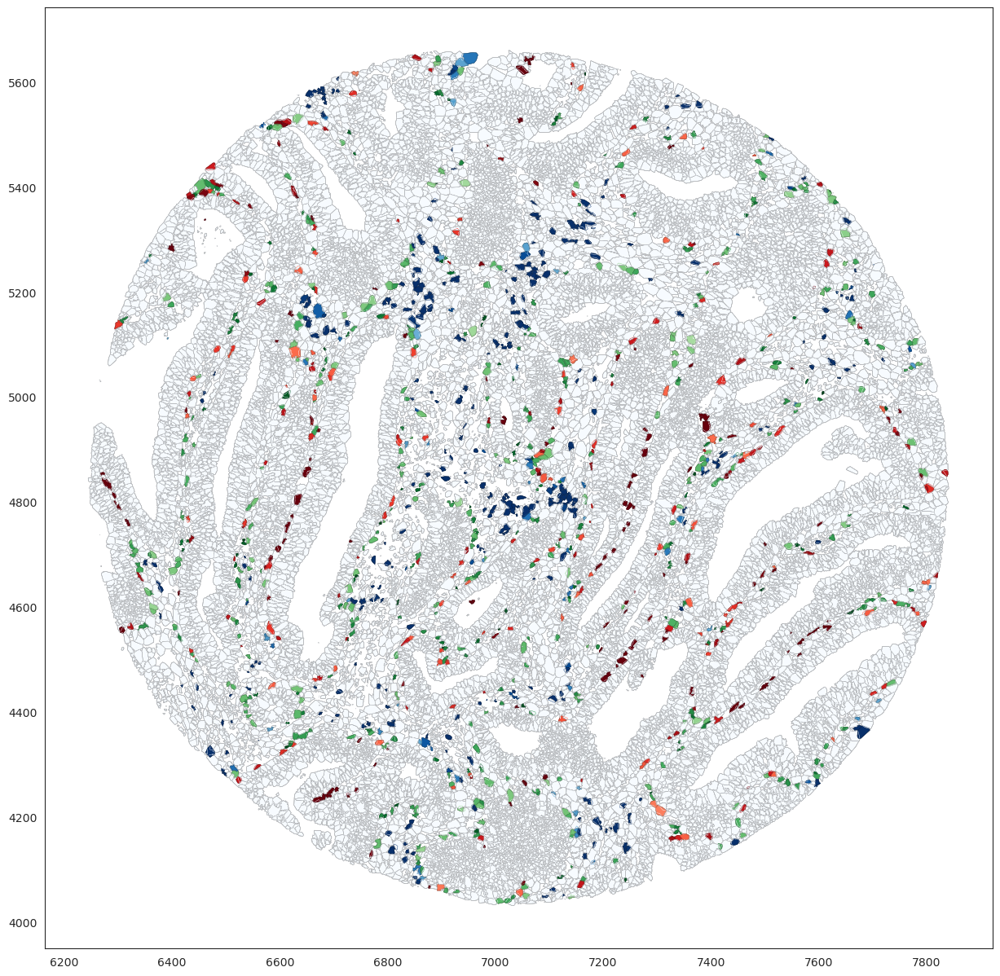

In [49]:
b_cells_annot = ['Macrophages']
immune_cells_data = adata_selection[adata_selection.obs['pheno_HR_level2'].isin(b_cells_annot)]
immune_cell_ids = set(immune_cells_data.obs['cellID'].values)


results_immune = {int(cell_id): cell_results for cell_id, cell_results in results.items() if int(cell_id) in immune_cell_ids}
plot_mask_results_cell(mask_dict, geojson_data, results_immune)
